In [2]:
import os
import sys
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')
sys.path.append('../src/')
import CONST
regex = re.compile('[^a-zA-Z0-9]')

f_trn = os.listdir(CONST.INTRNDIR)
f_tst = os.listdir(CONST.INTSTDIR)

trn = pd.DataFrame() 
tst = pd.DataFrame()
for f in f_trn:
    _df = pd.read_csv(os.path.join(CONST.INTRNDIR, f),
                                   encoding='shift-jis', usecols=list(range(0, 25)))
    _df['Engine'] = 'Train' + f.split('.')[0].split('_')[2]
    _df['Flight No'] = _df.index.values + 1
    trn = pd.concat([trn, _df], axis=0).reset_index(drop=True)
for f in f_tst:
    _df = pd.read_csv(os.path.join(CONST.INTSTDIR, f),
                                   encoding='shift-jis', usecols=list(range(0, 25)))
    _df['Engine'] = 'Test' + f.split('.')[0].split('_')[2]
    _df['Flight No'] = _df.index.values + 1
    tst = pd.concat([tst, _df], axis=0).reset_index(drop=True)
    
trn.columns = ["".join(regex.sub('', c.title()).split(' ')).strip() for c in trn.columns]
tst.columns = ["".join(regex.sub('', c.title()).split(' ')).strip() for c in tst.columns]
trn.head()

,Altitude,Mach,FlightRegime,PowerSettingTra,T2TotalTemperatureAtFanInletR,T24TotalTemperatureAtLpcOutletR,T30TotalTemperatureAtHpcOutletR,T50TotalTemperatureAtLptOutletR,P2PressureAtFanInletPsia,P15TotalPressureInBypassDuctPsia,...,NrcCorrectedCoreSpeedRpm,BprBypassRatio,FarbBurnerFuelAirRatio,HtbleedBleedEnthalpy,NfDmdDemandedFanSpeedRpm,PcnfrDmdDemandedCorrectedFanSpeedRpm,W31HptCoolantBleedLbmS,W32LptCoolantBleedLbmS,Engine,FlightNo
0,34.998,0.8400,5,100,449.44,555.32,1358.6,1137.2,5.48,8.00,...,8048.6,9.3461,0.02,334,2223,100.00,14.73,8.8071,Train001,1
1,41.998,0.8408,6,100,445.00,549.90,1353.2,1125.8,3.91,5.71,...,8072.3,9.3774,0.02,330,2212,100.00,10.41,6.2665,Train001,2
2,24.999,0.6218,4,60,462.54,537.31,1256.8,1047.5,7.05,9.02,...,7864.9,10.8940,0.02,309,1915,84.93,14.08,8.6723,Train001,3
3,42.008,0.8416,6,100,445.00,549.51,1354.0,1126.4,3.91,5.71,...,8068.7,9.3528,0.02,329,2212,100.00,10.59,6.4701,Train001,4
4,25.000,0.6203,4,60,462.54,537.07,1257.7,1047.9,7.05,9.03,...,7861.2,10.8960,0.02,309,1915,84.93,14.13,8.5286,Train001,5


In [3]:
trn.columns

Index(['Altitude', 'Mach', 'FlightRegime', 'PowerSettingTra',
       'T2TotalTemperatureAtFanInletR', 'T24TotalTemperatureAtLpcOutletR',
       'T30TotalTemperatureAtHpcOutletR', 'T50TotalTemperatureAtLptOutletR',
       'P2PressureAtFanInletPsia', 'P15TotalPressureInBypassDuctPsia',
       'P30TotalPressureAtHpcOutletPsia', 'NfPhysicalFanSpeedRpm',
       'NcPhysicalCoreSpeedRpm', 'EprEnginePressureRatioP50P2',
       'Ps30StaticPressureAtHpcOutletPsia', 'PhiRatioOfFuelFlowToPs30PpsPsi',
       'NrfCorrectedFanSpeedRpm', 'NrcCorrectedCoreSpeedRpm', 'BprBypassRatio',
       'FarbBurnerFuelAirRatio', 'HtbleedBleedEnthalpy',
       'NfDmdDemandedFanSpeedRpm', 'PcnfrDmdDemandedCorrectedFanSpeedRpm',
       'W31HptCoolantBleedLbmS', 'W32LptCoolantBleedLbmS', 'Engine',
       'FlightNo'],
      dtype='object')

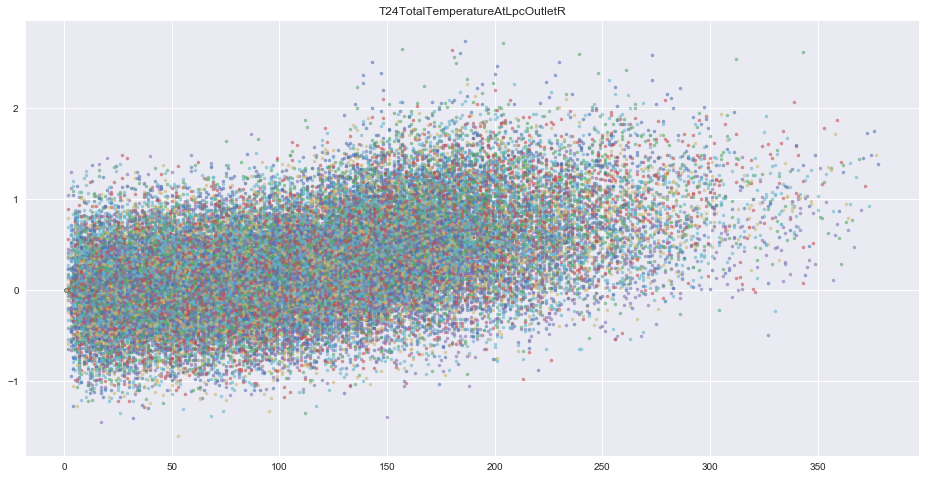

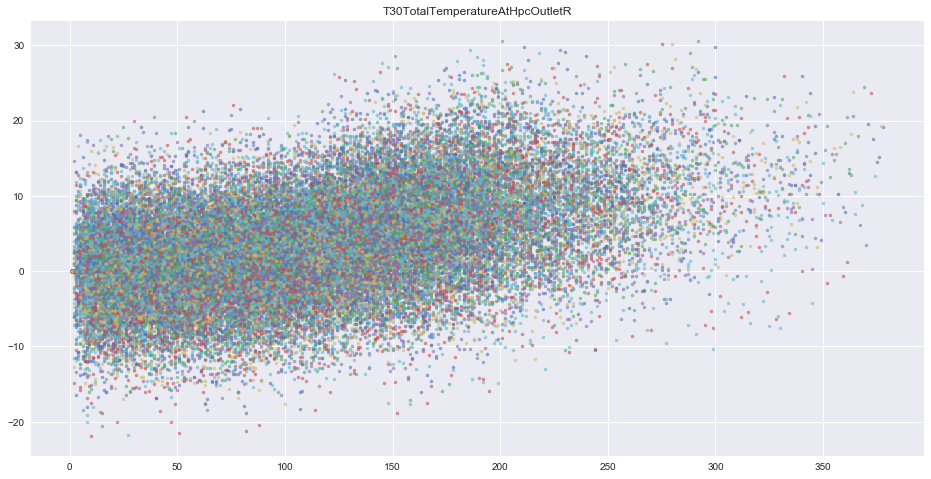

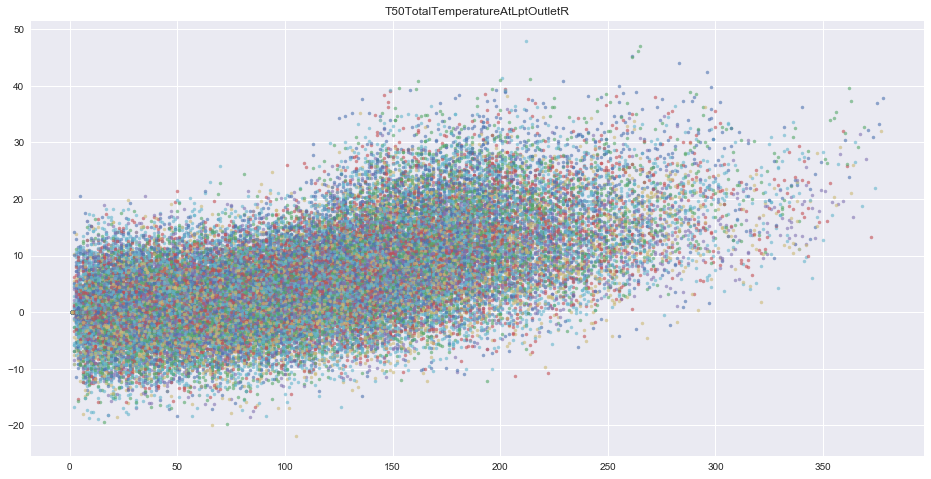

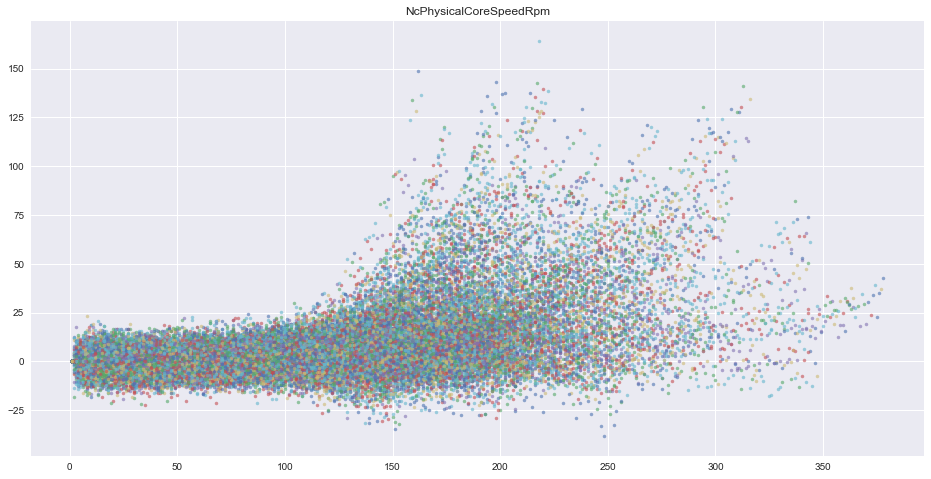

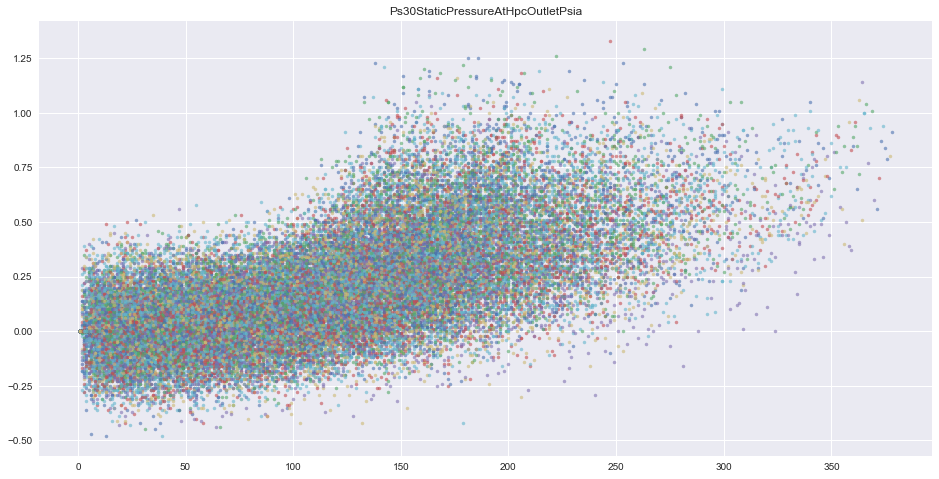

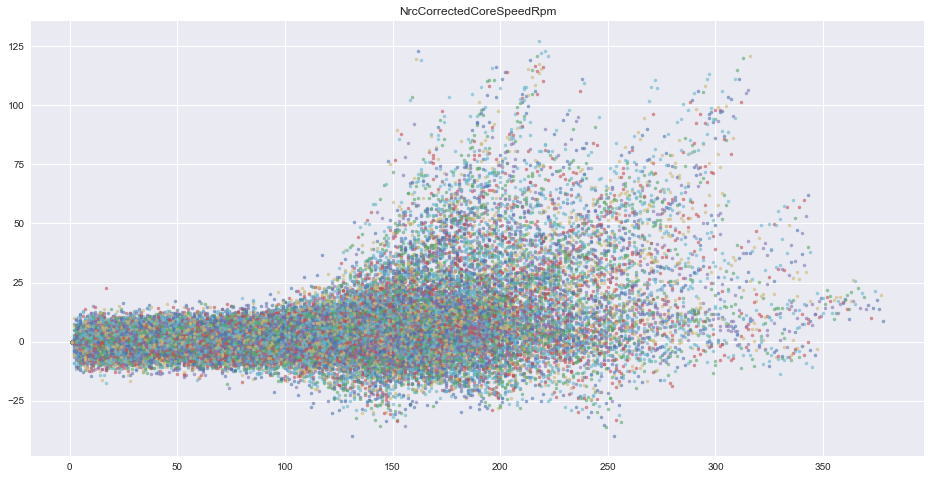

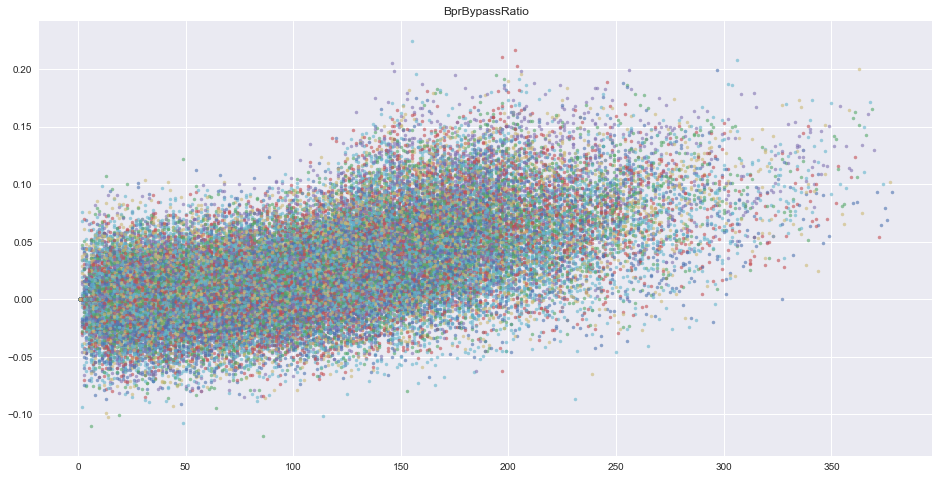

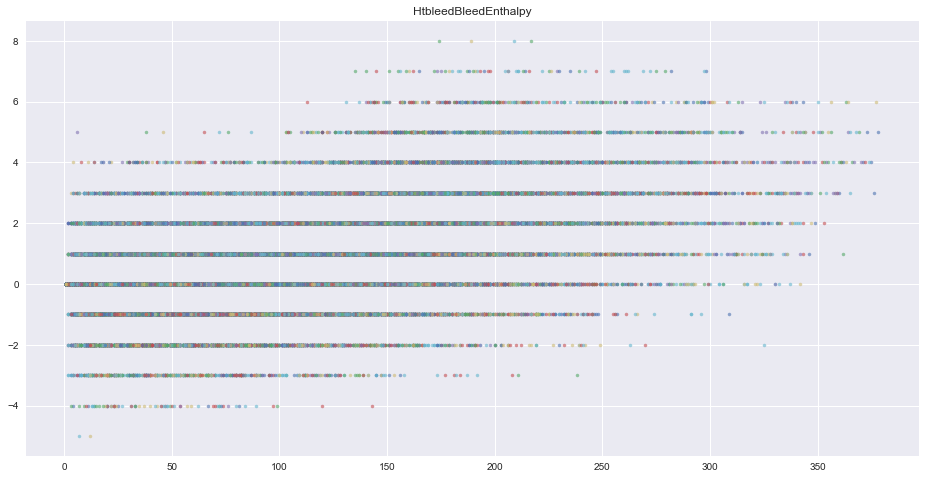

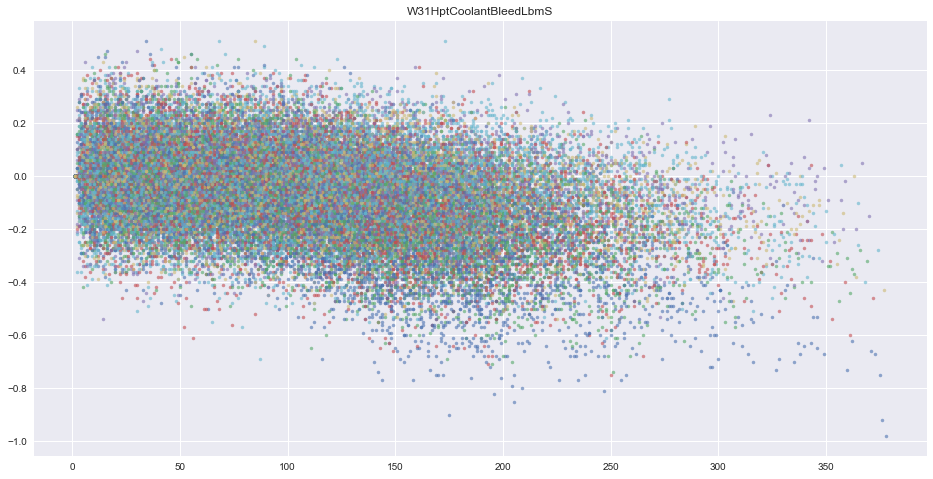

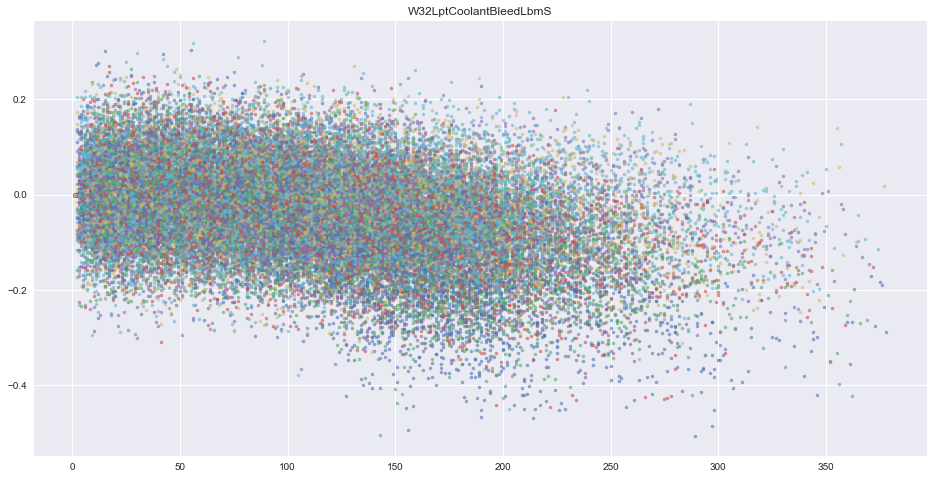

In [5]:
cp = sns.color_palette(n_colors=6)
for c in ["T24TotalTemperatureAtLpcOutletR", "T30TotalTemperatureAtHpcOutletR", "T50TotalTemperatureAtLptOutletR",
          "NcPhysicalCoreSpeedRpm",  "Ps30StaticPressureAtHpcOutletPsia",
          "NrcCorrectedCoreSpeedRpm", "BprBypassRatio", "HtbleedBleedEnthalpy", "W31HptCoolantBleedLbmS",
          "W32LptCoolantBleedLbmS",
         ]:
    plt.figure(figsize=(16, 8))
    plt.title(c)
    for e, g in trn.groupby('Engine'):
        for r, _g in g.groupby(['FlightRegime']):
            plt.plot(_g['FlightNo'], _g[c] - _g[c].iloc[0], '.', c=cp[r-1], alpha=.6)    
    plt.show()

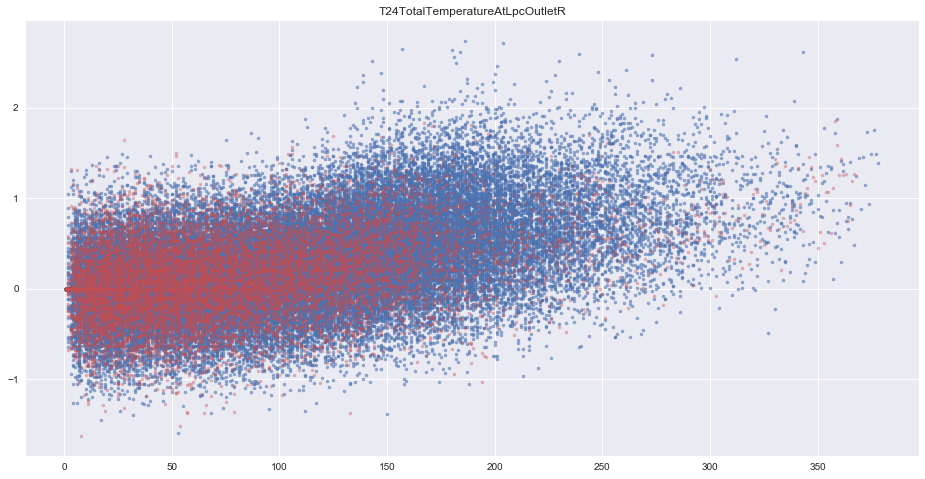

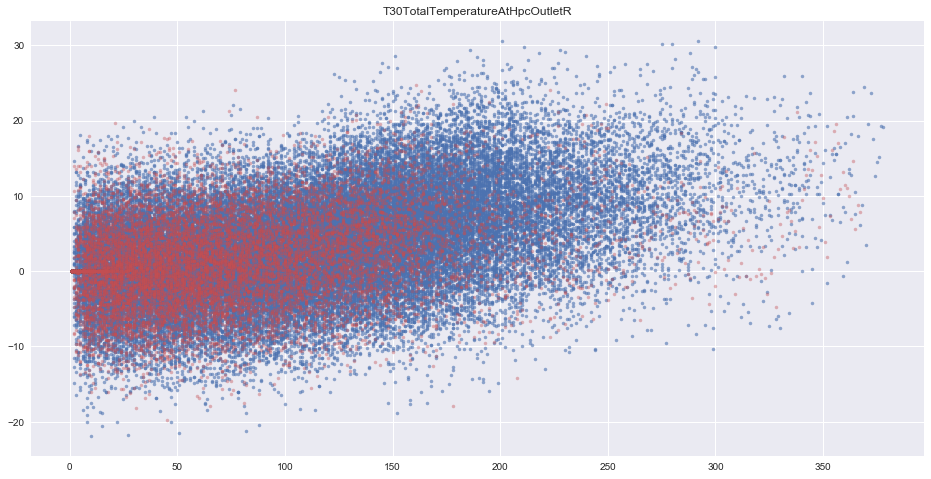

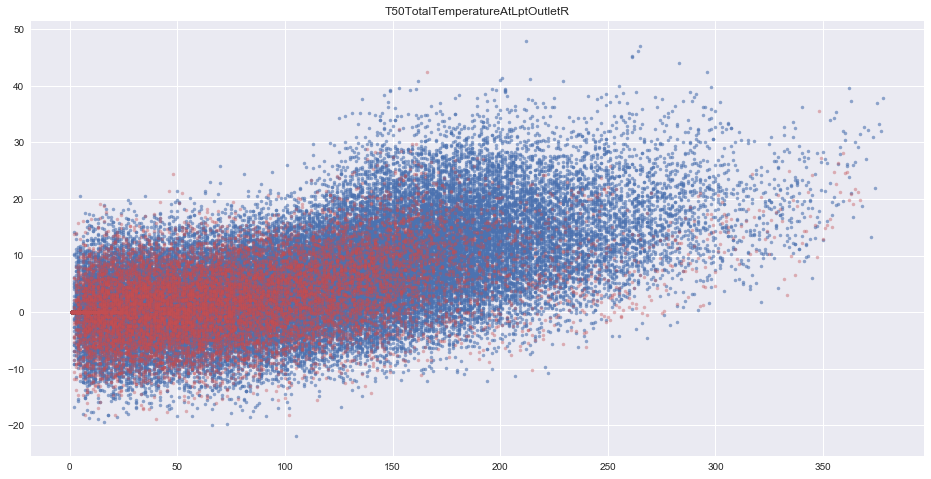

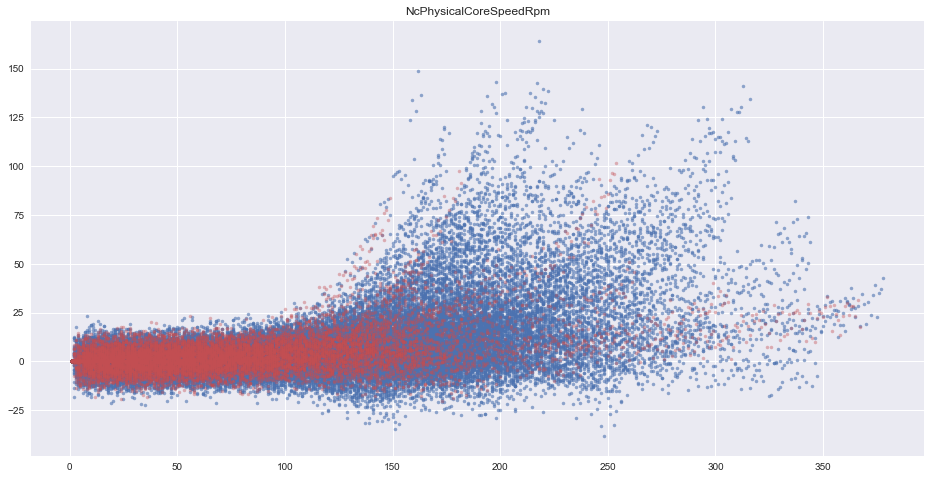

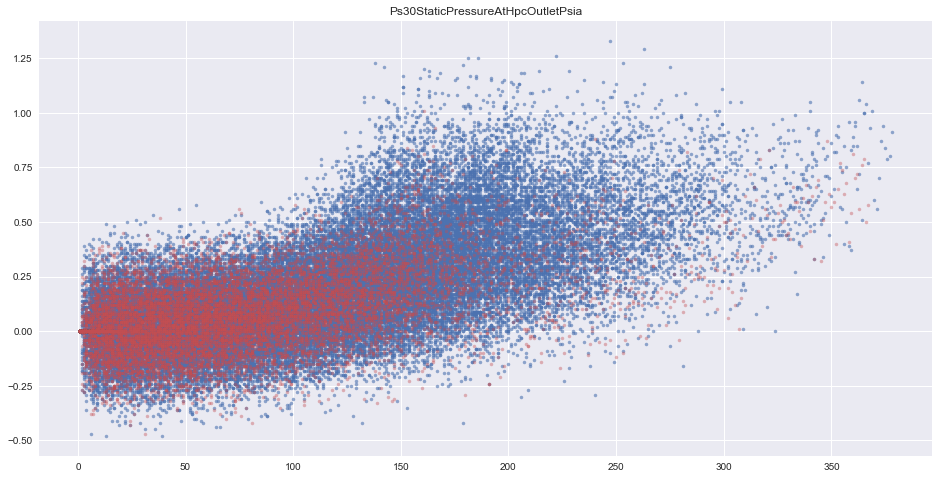

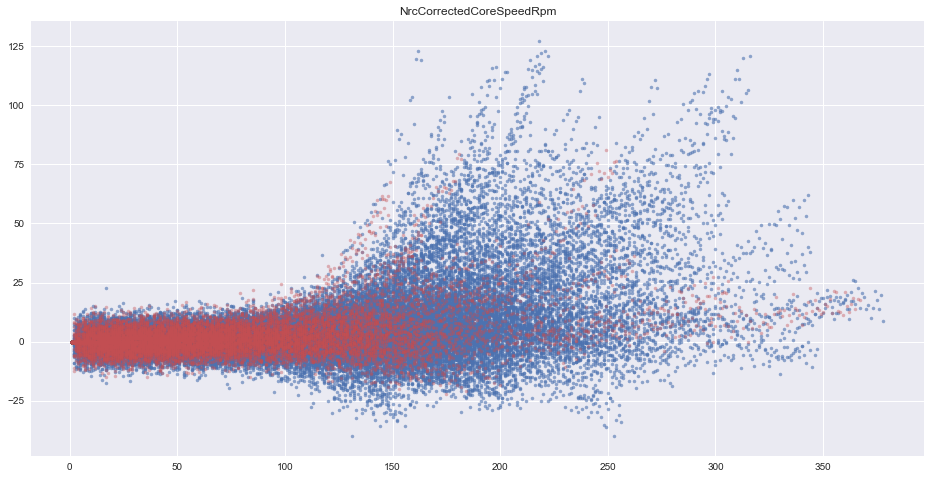

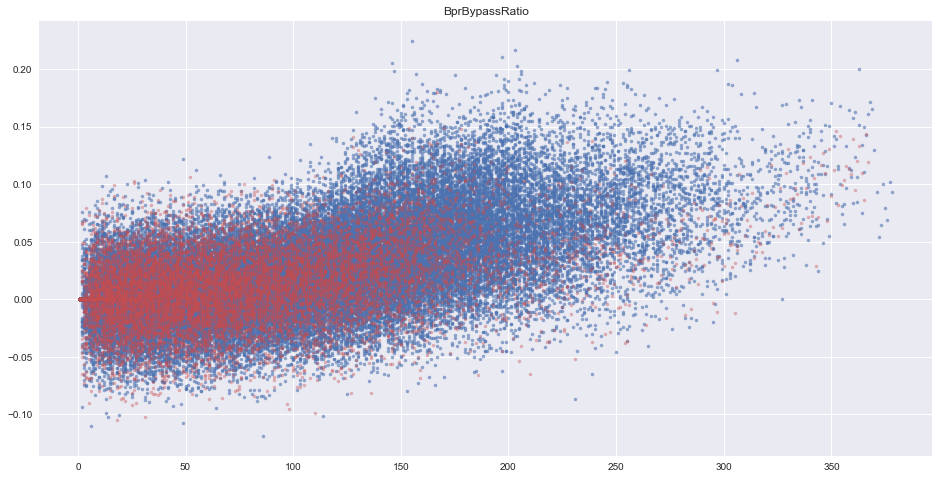

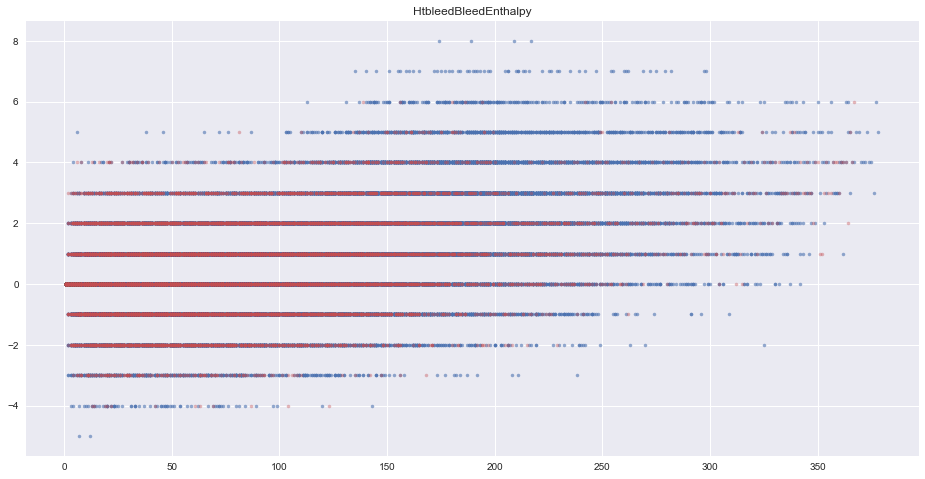

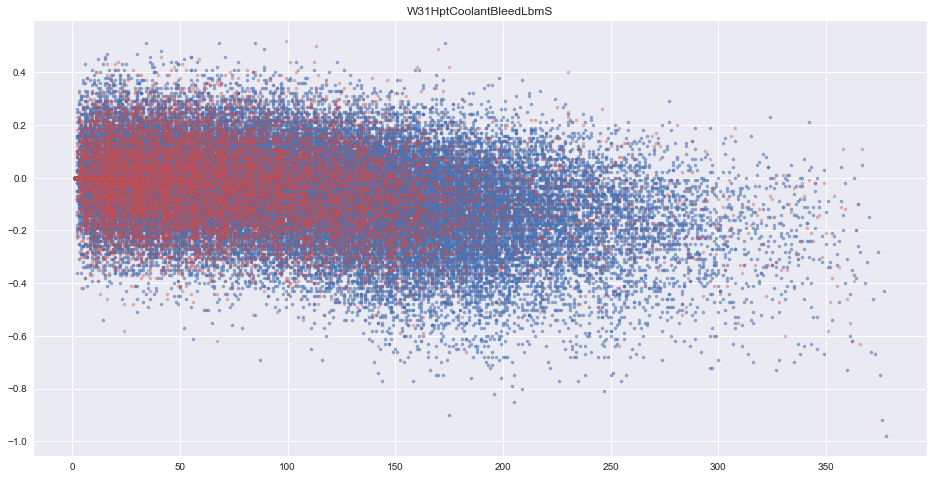

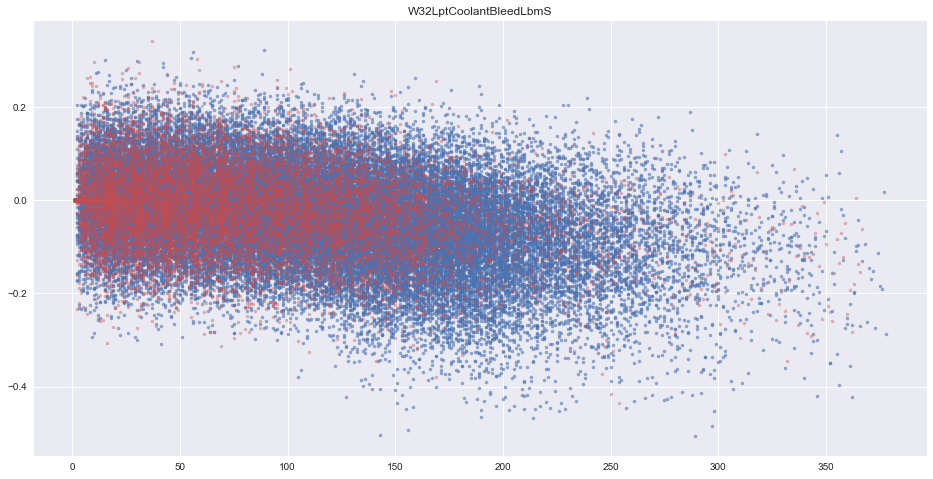

In [6]:
cp = sns.color_palette(n_colors=6)
for c in ["T24TotalTemperatureAtLpcOutletR", "T30TotalTemperatureAtHpcOutletR", "T50TotalTemperatureAtLptOutletR",
          "NcPhysicalCoreSpeedRpm",  "Ps30StaticPressureAtHpcOutletPsia",
          "NrcCorrectedCoreSpeedRpm", "BprBypassRatio", "HtbleedBleedEnthalpy", "W31HptCoolantBleedLbmS",
          "W32LptCoolantBleedLbmS",
         ]:
    plt.figure(figsize=(16, 8))
    plt.title(c)
    for e, g in trn.groupby('Engine'):
        for r, _g in g.groupby(['FlightRegime']):
            plt.plot(_g['FlightNo'], _g[c] - _g[c].iloc[0], '.', c=cp[0], alpha=.6)    
    for e, g in tst.groupby('Engine'):
        for r, _g in g.groupby(['FlightRegime']):
            plt.plot(_g['FlightNo'], _g[c] - _g[c].iloc[0], '.', c=cp[2], alpha=.4)    
    plt.show()

In [24]:
offset_features = ["T30TotalTemperatureAtHpcOutletR", "T50TotalTemperatureAtLptOutletR",
 "NcPhysicalCoreSpeedRpm",  "Ps30StaticPressureAtHpcOutletPsia",
 "NrcCorrectedCoreSpeedRpm", "BprBypassRatio", "HtbleedBleedEnthalpy"]
offset_trn = trn[offset_features + ['Engine', 'FlightRegime', 'FlightNo']].copy()
for f in offset_features:
    print("Offset Feature =", f)
    for eng in offset_trn.Engine.unique():
        for regime in offset_trn.FlightRegime.unique():
            offset_trn.loc[(offset_trn.Engine==eng) & (offset_trn.FlightRegime==regime), f] -=\
            offset_trn.loc[(offset_trn.Engine==eng) & (offset_trn.FlightRegime==regime), f].iloc[0]

Offset Feature = T30TotalTemperatureAtHpcOutletR
Offset Feature = T50TotalTemperatureAtLptOutletR
Offset Feature = NcPhysicalCoreSpeedRpm
Offset Feature = Ps30StaticPressureAtHpcOutletPsia
Offset Feature = NrcCorrectedCoreSpeedRpm
Offset Feature = BprBypassRatio
Offset Feature = HtbleedBleedEnthalpy


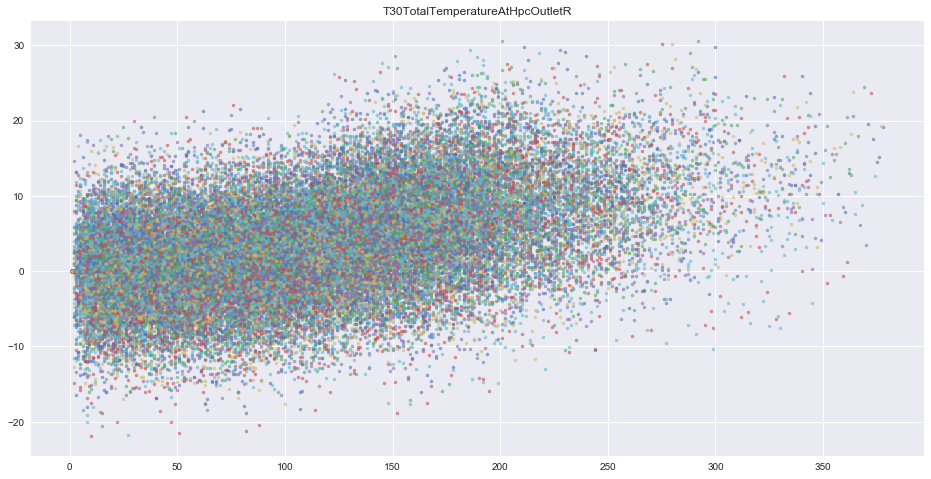

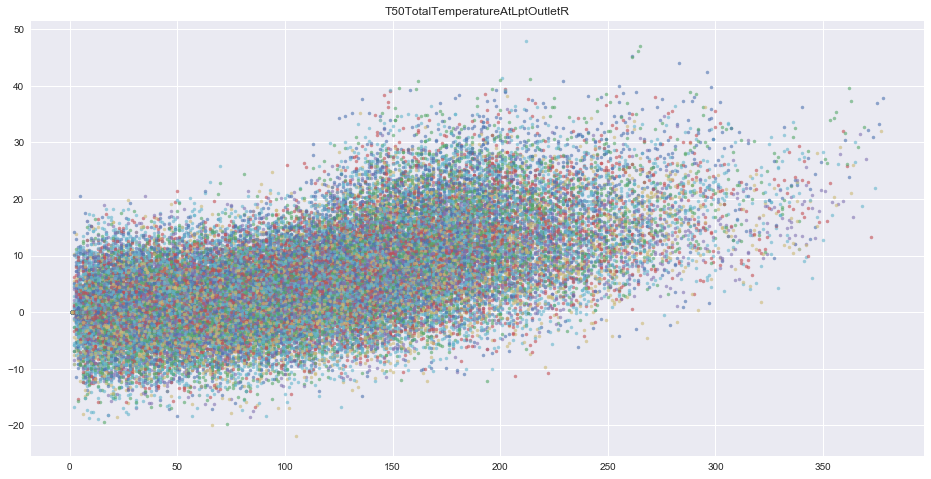

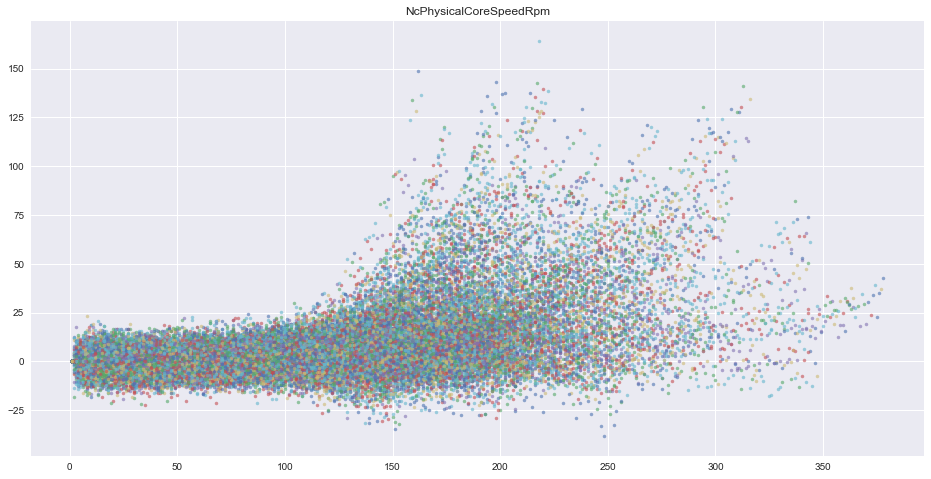

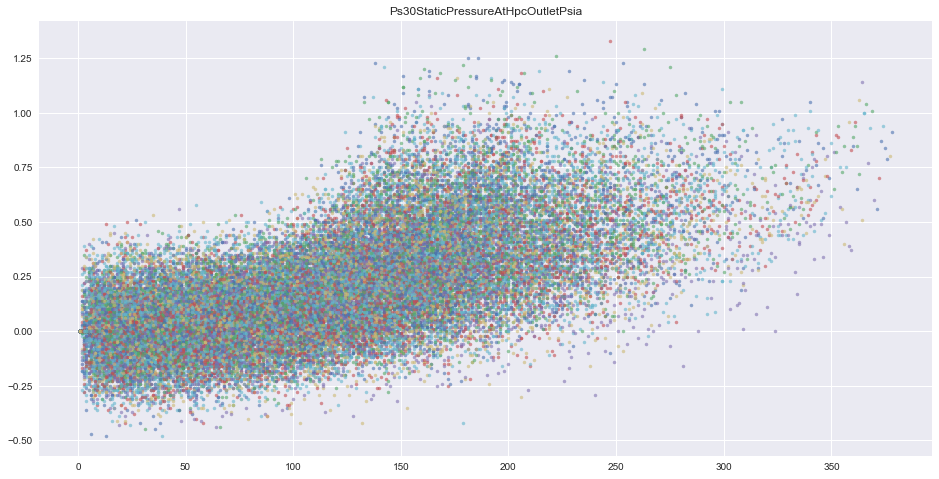

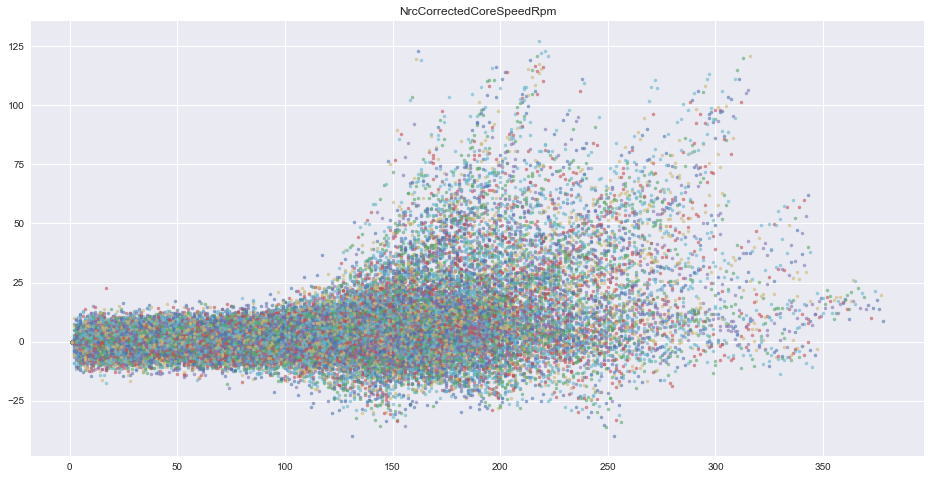

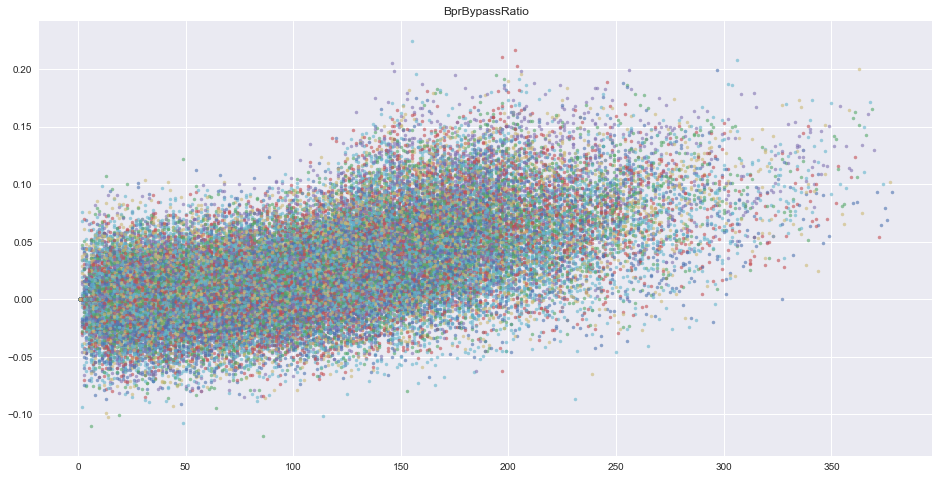

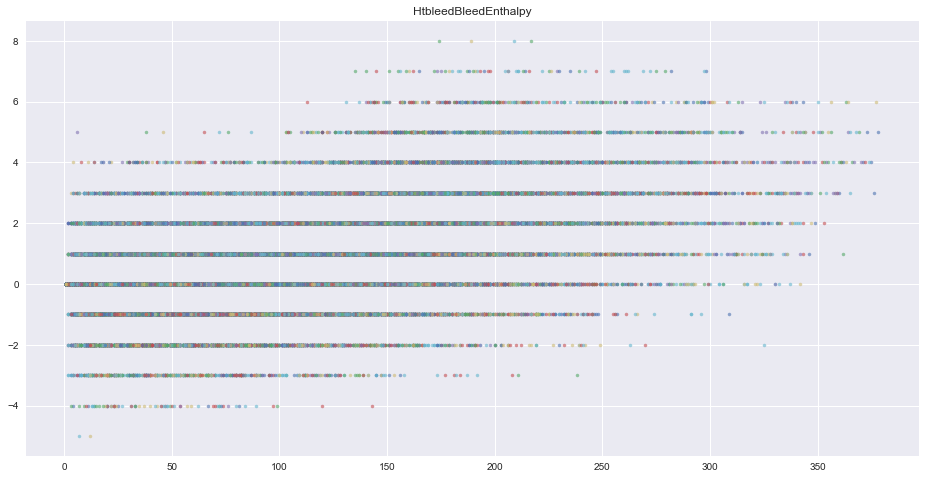

In [26]:
for c in ["T30TotalTemperatureAtHpcOutletR", "T50TotalTemperatureAtLptOutletR",
          "NcPhysicalCoreSpeedRpm",  "Ps30StaticPressureAtHpcOutletPsia",
          "NrcCorrectedCoreSpeedRpm", "BprBypassRatio", "HtbleedBleedEnthalpy"]:
    plt.figure(figsize=(16, 8))
    plt.title(c)
    for e, g in offset_trn.groupby('Engine'):
        for r, _g in g.groupby(['FlightRegime']):
            plt.plot(_g['FlightNo'], _g[c], '.', c=cp[r-1], alpha=.6) 